# Setup

In [1]:
import sys
assert sys.version_info >= (3, 5)

IS_COLAB = "google.colab" in sys.modules
IS_KAGGLE = "kaggle_secrets" in sys.modules

import sklearn
assert sklearn.__version__ >= "0.20"

import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.0"

if not tf.config.list_physical_devices('GPU'):
    print("No GPU was detected. LSTMs and CNNs can be very slow without a GPU.")
    if IS_COLAB:
        print("Go to Runtime > Change runtime and select a GPU hardware accelerator.")
    if IS_KAGGLE:
        print("Go to Settings > Accelerator and select GPU.")
        
import numpy as np
import os

np.random.seed(100)
tf.random.set_seed(100)

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

import warnings
warnings.simplefilter("ignore")

PROJECT_ROOT_DIR = "."
CHAPTER_ID = "autoencoders"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID)
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

2024-11-03 07:04:10.257705: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-03 07:04:10.547831: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2024-11-03 07:04:10.547885: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2024-11-03 07:04:10.604926: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-03 07:04:11.887460: W tensorflow/stream_executor/platform/de

No GPU was detected. LSTMs and CNNs can be very slow without a GPU.


2024-11-03 07:04:14.227654: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2024-11-03 07:04:14.227734: W tensorflow/stream_executor/cuda/cuda_driver.cc:263] failed call to cuInit: UNKNOWN ERROR (303)
2024-11-03 07:04:14.227781: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (jupyter_machrafal): /proc/driver/nvidia/version does not exist


A couple utility functions to plot grayscale 28x28 image:

In [2]:
def plot_image(image):
    plt.imshow(image, cmap="binary")
    plt.axis("off")

# PCA with a linear Autoencoder

Build 3D dataset:

In [3]:
np.random.seed(4)

def generate_3d_data(m, w1=0.1, w2=0.3, noise=0.1):
    angles = np.random.rand(m) * 3 * np.pi / 2 - 0.5
    data = np.empty((m, 3))
    data[:, 0] = np.cos(angles) + np.sin(angles)/2 + noise * np.random.randn(m) / 2
    data[:, 1] = np.sin(angles) * 0.7 + noise * np.random.randn(m) / 2
    data[:, 2] = data[:, 0] * w1 + data[:, 1] * w2 + noise * np.random.randn(m)
    return data

X_train = generate_3d_data(60)
X_train = X_train - X_train.mean(axis=0, keepdims=0)

Now let's build the Autoencoder...

In [4]:
np.random.seed(42)
tf.random.set_seed(42)

encoder = keras.models.Sequential([keras.layers.Dense(2, input_shape=[3])])
decoder = keras.models.Sequential([keras.layers.Dense(3, input_shape=[2])])
autoencoder = keras.models.Sequential([encoder, decoder])

autoencoder.compile(loss="mse", optimizer=keras.optimizers.SGD(learning_rate=1.5))

2024-11-03 07:04:15.595994: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [5]:
history = autoencoder.fit(X_train, X_train, epochs=20)

Epoch 1/20
2/2 [==============================] - 1s 6ms/step - loss: 0.4140
Epoch 2/20
2/2 [==============================] - 0s 4ms/step - loss: 0.2619
Epoch 3/20
2/2 [==============================] - 0s 3ms/step - loss: 0.1798
Epoch 4/20
2/2 [==============================] - 0s 4ms/step - loss: 0.0686
Epoch 5/20
2/2 [==============================] - 0s 4ms/step - loss: 0.1620
Epoch 6/20
2/2 [==============================] - 0s 3ms/step - loss: 0.2215
Epoch 7/20
2/2 [==============================] - 0s 5ms/step - loss: 0.0311
Epoch 8/20
2/2 [==============================] - 0s 4ms/step - loss: 0.0178
Epoch 9/20
2/2 [==============================] - 0s 5ms/step - loss: 0.0097
Epoch 10/20
2/2 [==============================] - 0s 4ms/step - loss: 0.0068
Epoch 11/20
2/2 [==============================] - 0s 3ms/step - loss: 0.0053
Epoch 12/20
2/2 [==============================] - 0s 3ms/step - loss: 0.0049
Epoch 13/20
2/2 [==============================] - 0s 3ms/step - loss: 0.

In [6]:
codings = encoder.predict(X_train)

2/2 [==============================] - 0s 4ms/step


Saving figure linear_autoencoder_pca_plot


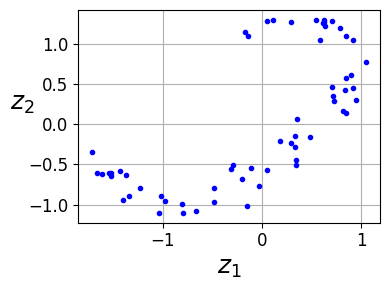

In [7]:
fig = plt.figure(figsize=(4, 3))
plt.plot(codings[:,0], codings[:, 1], "b.")
plt.xlabel("$z_1$", fontsize=18)
plt.ylabel("$z_2$", fontsize=18, rotation=0)
plt.grid(True)
save_fig("linear_autoencoder_pca_plot")
plt.show()

# Stacked Autoencoders

Let's use MNIST:

In [8]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train_full = X_train_full.astype(np.float32) / 255
X_test = X_test.astype(np.float32) / 255
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

4422102/4422102 [==============================] - 0s 0us/step


## Train all layers at once

Let's build a stacked Autoencoder with 3 hidden layers and 1 output layer (i.e., 2 stacked Autoencoders).

In [9]:
def rounded_accuracy(y_true, y_pred):
    return keras.metrics.binary_accuracy(tf.round(y_true), tf.round(y_pred))

In [10]:
tf.random.set_seed(42)
np.random.seed(42)

stacked_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu"),
])
stacked_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
stacked_ae = keras.models.Sequential([stacked_encoder, stacked_decoder])
stacked_ae.compile(loss="binary_crossentropy",
                   optimizer=keras.optimizers.SGD(learning_rate=1.5), metrics=[rounded_accuracy])
history = stacked_ae.fit(X_train, X_train, epochs=20,
                         validation_data=(X_valid, X_valid))

Epoch 1/20
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3362 - rounded_accuracy: 0.8884 - val_loss: 0.3154 - val_rounded_accuracy: 0.9007
Epoch 2/20
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3041 - rounded_accuracy: 0.9166 - val_loss: 0.3016 - val_rounded_accuracy: 0.9219
Epoch 3/20
1719/1719 [==============================] - 10s 6ms/step - loss: 0.2974 - rounded_accuracy: 0.9227 - val_loss: 0.2979 - val_rounded_accuracy: 0.9244
Epoch 4/20
1719/1719 [==============================] - 10s 6ms/step - loss: 0.2935 - rounded_accuracy: 0.9262 - val_loss: 0.2930 - val_rounded_accuracy: 0.9293
Epoch 5/20
1719/1719 [==============================] - 11s 7ms/step - loss: 0.2908 - rounded_accuracy: 0.9287 - val_loss: 0.2903 - val_rounded_accuracy: 0.9312
Epoch 6/20
1719/1719 [==============================] - 10s 6ms/step - loss: 0.2887 - rounded_accuracy: 0.9306 - val_loss: 0.2889 - val_rounded_accuracy: 0.9315
Epoch 7/20
1719/1719 [============

This function processes a few test images through the autoencoder and displays the original images and their reconstructions:

In [11]:
def show_reconstructions(model, images=X_valid, n_images=5):
    reconstructions = model.predict(images[:n_images])
    fig = plt.figure(figsize=(n_images * 1.5, 3))
    for image_index in range(n_images):
        plt.subplot(2, n_images, 1 + image_index)
        plot_image(images[image_index])
        plt.subplot(2, n_images, 1 + n_images + image_index)
        plot_image(reconstructions[image_index])

1/1 [==============================] - 0s 118ms/step
Saving figure reconstruction_plot


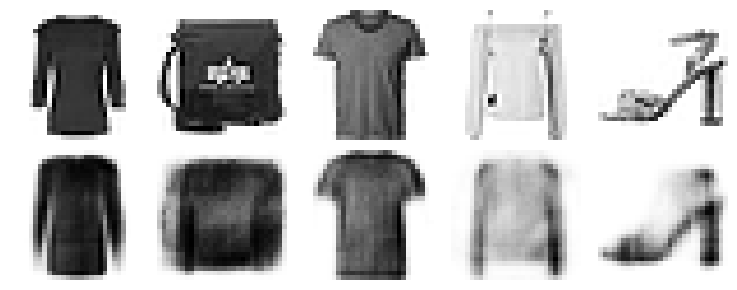

In [12]:
show_reconstructions(stacked_ae)
save_fig("reconstruction_plot")

# Visualizing Fashion MNIST

In [13]:
np.random.seed(100)

from sklearn.manifold import TSNE

X_valid_compressed = stacked_encoder.predict(X_valid)
tsne = TSNE()
X_valid_2D = tsne.fit_transform(X_valid_compressed)
X_valid_2D = (X_valid_2D - X_valid_2D.min()) / (X_valid_2D.max() - X_valid_2D.min())

157/157 [==============================] - 0s 2ms/step


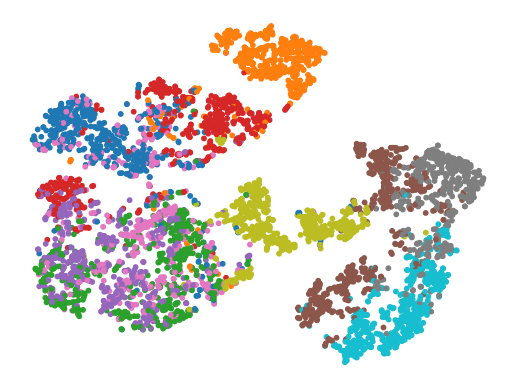

In [14]:
plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=y_valid, s=10, cmap="tab10")
plt.axis("off")
plt.show()

Let's make this diagram a bit prettier:

Saving figure fashion_mnist_visualization_plot


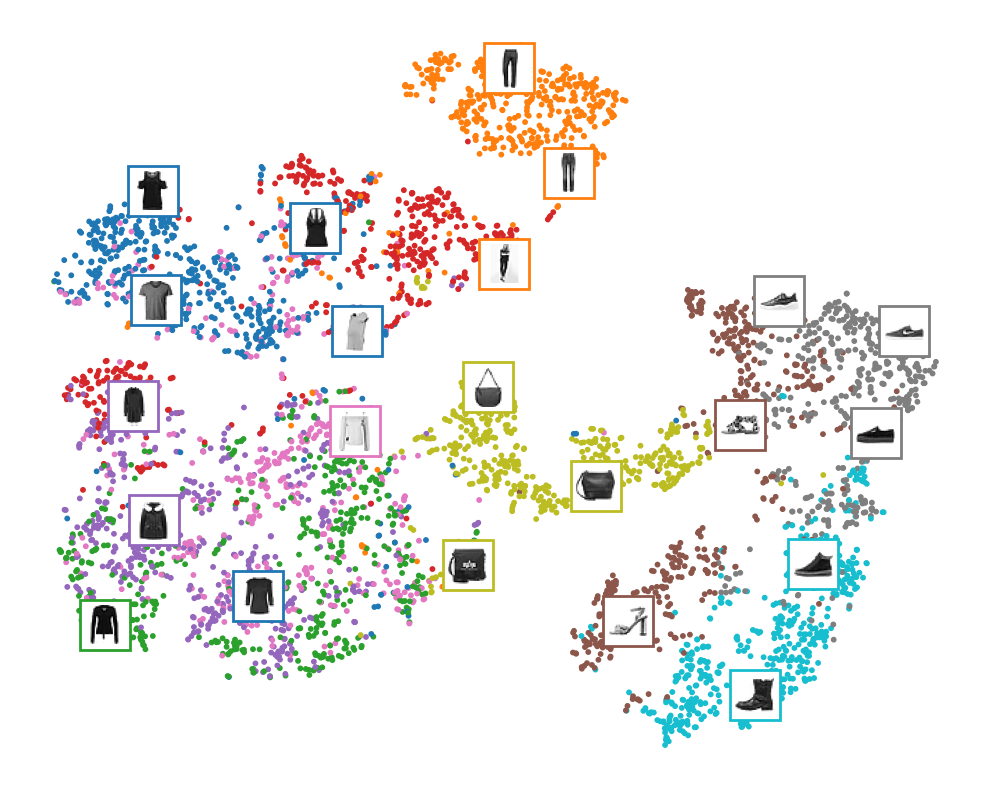

In [15]:
plt.figure(figsize=(10, 8))
cmap = plt.cm.tab10
plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=y_valid, s=10, cmap=cmap)
image_positions = np.array([[1., 1.]])
for index, position in enumerate(X_valid_2D):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 0.02:
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(X_valid[index], cmap="binary"),
            position, bboxprops={"edgecolor": cmap(y_valid[index]), "lw": 2})
        plt.gca().add_artist(imagebox)
plt.axis("off")
save_fig("fashion_mnist_visualization_plot")
plt.show()

## Tying weights

It is common to tie the weights of the encoder and the decoder, by simply using the transpose of the encoder's weights as the decoder weights. For this, we need to use a custom layer.

In [16]:
class DenseTranspose(keras.layers.Layer):
    def __init__(self, dense, activation=None, **kwargs):
        self.dense = dense
        self.activation = keras.activations.get(activation)
        super().__init__(**kwargs)
    def build(self, batch_input_shape):
        self.biases = self.add_weight(name="bias",
                                      shape=[self.dense.input_shape[-1]],
                                      initializer="zeros")
        super().build(batch_input_shape)
    def call(self, inputs):
        z = tf.matmul(inputs, self.dense.weights[0], transpose_b=True)
        return self.activation(z + self.biases)

In [17]:
keras.backend.clear_session()
np.random.seed(100)

dense_1 = keras.layers.Dense(100, activation="selu")
dense_2 = keras.layers.Dense(30, activation="selu")

tied_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    dense_1,
    dense_2
])

tied_decoder = keras.models.Sequential([
    DenseTranspose(dense_2, activation="selu"),
    DenseTranspose(dense_1, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])

tied_ae = keras.models.Sequential([tied_encoder, tied_decoder])

tied_ae.compile(loss="binary_crossentropy",
                optimizer=keras.optimizers.SGD(learning_rate=1.5), metrics=[rounded_accuracy])
history = tied_ae.fit(X_train, X_train, epochs=10,
                      validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3289 - rounded_accuracy: 0.8936 - val_loss: 0.3070 - val_rounded_accuracy: 0.9102
Epoch 2/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.2980 - rounded_accuracy: 0.9215 - val_loss: 0.3000 - val_rounded_accuracy: 0.9252
Epoch 3/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.2917 - rounded_accuracy: 0.9275 - val_loss: 0.2960 - val_rounded_accuracy: 0.9174
Epoch 4/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.2885 - rounded_accuracy: 0.9305 - val_loss: 0.2885 - val_rounded_accuracy: 0.9332
Epoch 5/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.2865 - rounded_accuracy: 0.9324 - val_loss: 0.2864 - val_rounded_accuracy: 0.9339
Epoch 6/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.2850 - rounded_accuracy: 0.9337 - val_loss: 0.2861 - val_rounded_accuracy: 0.9348
Epoch 7/10
1719/1719 [============

1/1 [==============================] - 0s 103ms/step


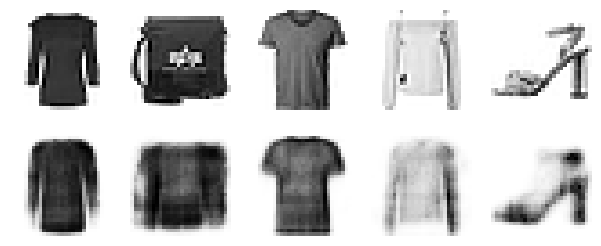

In [18]:
show_reconstructions(tied_ae)
plt.show()

## Training one Autoencoder at a Time

In [19]:
def train_autoencoder(n_neurons, X_train, X_valid, loss, optimizer,
                      n_epochs=10, output_activation=None, metrics=None):
    n_inputs = X_train.shape[-1]
    encoder = keras.models.Sequential([
        keras.layers.Dense(n_neurons, activation="selu", input_shape=[n_inputs])
    ])
    decoder = keras.models.Sequential([
        keras.layers.Dense(n_inputs, activation=output_activation),
    ])
    autoencoder = keras.models.Sequential([encoder, decoder])
    autoencoder.compile(optimizer, loss, metrics=metrics)
    autoencoder.fit(X_train, X_train, epochs=n_epochs,
                    validation_data=(X_valid, X_valid))
    return encoder, decoder, encoder(X_train), encoder(X_valid)

In [20]:
tf.random.set_seed(100)
np.random.seed(100)

K = keras.backend
X_train_flat = K.batch_flatten(X_train)
X_valid_flat = K.batch_flatten(X_valid)
enc1, dec1, X_train_enc1, X_valid_enc1 = train_autoencoder(
    100, X_train_flat, X_valid_flat, "binary_crossentropy",
    keras.optimizers.SGD(learning_rate=1.5), output_activation="sigmoid",
    metrics=[rounded_accuracy])
enc2, dec2, _, _ = train_autoencoder(
    30, X_train_enc1, X_valid_enc1, "mse", keras.optimizers.SGD(learning_rate=0.05),
    output_activation="selu")

Epoch 1/10
1719/1719 [==============================] - 14s 8ms/step - loss: 0.3447 - rounded_accuracy: 0.8876 - val_loss: 0.3122 - val_rounded_accuracy: 0.9143
Epoch 2/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3037 - rounded_accuracy: 0.9205 - val_loss: 0.3005 - val_rounded_accuracy: 0.9254
Epoch 3/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.2949 - rounded_accuracy: 0.9285 - val_loss: 0.2936 - val_rounded_accuracy: 0.9313
Epoch 4/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.2895 - rounded_accuracy: 0.9337 - val_loss: 0.2892 - val_rounded_accuracy: 0.9355
Epoch 5/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.2858 - rounded_accuracy: 0.9372 - val_loss: 0.2862 - val_rounded_accuracy: 0.9384
Epoch 6/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.2832 - rounded_accuracy: 0.9398 - val_loss: 0.2839 - val_rounded_accuracy: 0.9406
Epoch 7/10
1719/1719 [=================

In [21]:
stacked_ae_1_by_1 = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    enc1, enc2, dec2, dec1,
    keras.layers.Reshape([28, 28])
])

1/1 [==============================] - 0s 108ms/step


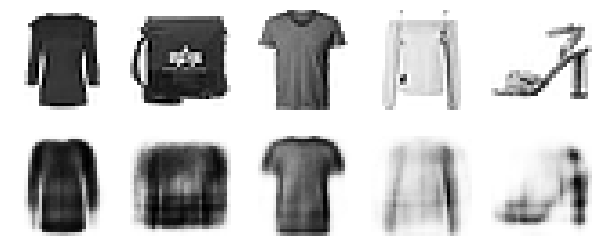

In [22]:
show_reconstructions(stacked_ae_1_by_1)
plt.show()

In [23]:
stacked_ae_1_by_1.compile(loss="binary_crossentropy",
                          optimizer=keras.optimizers.SGD(learning_rate=0.1), metrics=[rounded_accuracy])
history = stacked_ae_1_by_1.fit(X_train, X_train, epochs=10,
                                validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 10s 5ms/step - loss: 0.2848 - rounded_accuracy: 0.9365 - val_loss: 0.2864 - val_rounded_accuracy: 0.9360
Epoch 2/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.2845 - rounded_accuracy: 0.9369 - val_loss: 0.2862 - val_rounded_accuracy: 0.9371
Epoch 3/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.2843 - rounded_accuracy: 0.9371 - val_loss: 0.2860 - val_rounded_accuracy: 0.9369
Epoch 4/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.2841 - rounded_accuracy: 0.9372 - val_loss: 0.2858 - val_rounded_accuracy: 0.9371
Epoch 5/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.2840 - rounded_accuracy: 0.9374 - val_loss: 0.2857 - val_rounded_accuracy: 0.9373
Epoch 6/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.2839 - rounded_accuracy: 0.9375 - val_loss: 0.2856 - val_rounded_accuracy: 0.9374
Epoch 7/10
1719/1719 [=================

1/1 [==============================] - 0s 92ms/step


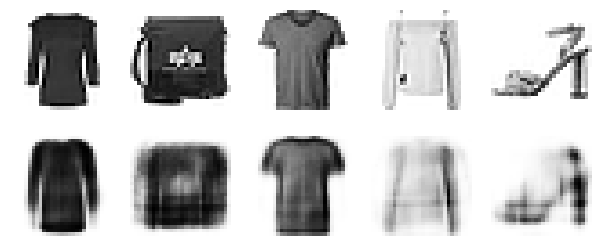

In [24]:
show_reconstructions(stacked_ae_1_by_1)
plt.show()

## Using Convolutional Layers Instead of Dense Layers

Let's build a stacked Autoencoder with 3 hidden layers and 1 output layer (i.e., 2 stacked Autoencoders).

In [25]:
tf.random.set_seed(100)
np.random.seed(100)

conv_encoder = keras.models.Sequential([
    keras.layers.Reshape([28, 28, 1], input_shape=[28, 28]),
    keras.layers.Conv2D(16, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
    keras.layers.Conv2D(32, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
    keras.layers.Conv2D(64, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2)
])
conv_decoder = keras.models.Sequential([
    keras.layers.Conv2DTranspose(32, kernel_size=3, strides=2, padding="VALID", activation="selu",
                                input_shape=[3, 3, 64]),
    keras.layers.Conv2DTranspose(16, kernel_size=3, strides=2, padding="SAME", activation="selu"),
    keras.layers.Conv2DTranspose(1, kernel_size=3, strides=2, padding="SAME", activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
conv_ae = keras.models.Sequential([conv_encoder, conv_decoder])

conv_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
                metrics=[rounded_accuracy])
history = conv_ae.fit(X_train, X_train, epochs=5,
                      validation_data=(X_valid, X_valid))

Epoch 1/5
1719/1719 [==============================] - 39s 22ms/step - loss: 0.3018 - rounded_accuracy: 0.9187 - val_loss: 0.2800 - val_rounded_accuracy: 0.9393
Epoch 2/5
1719/1719 [==============================] - 37s 21ms/step - loss: 0.2760 - rounded_accuracy: 0.9411 - val_loss: 0.2748 - val_rounded_accuracy: 0.9443
Epoch 3/5
1719/1719 [==============================] - 48s 28ms/step - loss: 0.2713 - rounded_accuracy: 0.9459 - val_loss: 0.2710 - val_rounded_accuracy: 0.9470
Epoch 4/5
1719/1719 [==============================] - 39s 23ms/step - loss: 0.2685 - rounded_accuracy: 0.9486 - val_loss: 0.2679 - val_rounded_accuracy: 0.9513
Epoch 5/5
1719/1719 [==============================] - 38s 22ms/step - loss: 0.2666 - rounded_accuracy: 0.9506 - val_loss: 0.2667 - val_rounded_accuracy: 0.9523


In [26]:
conv_encoder.summary()
conv_decoder.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_2 (Reshape)         (None, 28, 28, 1)         0         
                                                                 
 conv2d (Conv2D)             (None, 28, 28, 16)        160       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 7, 32)         0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 7, 7, 64)        

1/1 [==============================] - 0s 234ms/step


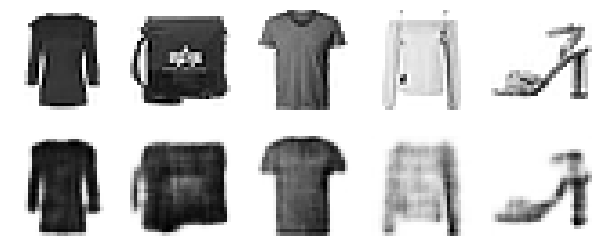

In [27]:
show_reconstructions(conv_ae)
plt.show()

# Recurrent Autoencoders

In [28]:
recurrent_encoder = keras.models.Sequential([
    keras.layers.LSTM(100, return_sequences=True, input_shape=[28, 28]),
    keras.layers.LSTM(30)
])
recurrent_decoder = keras.models.Sequential([
    keras.layers.RepeatVector(28, input_shape=[30]),
    keras.layers.LSTM(100, return_sequences=True),
    keras.layers.TimeDistributed(keras.layers.Dense(28, activation="sigmoid"))
])
recurrent_ae = keras.models.Sequential([recurrent_encoder, recurrent_decoder])
recurrent_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(0.1),
                     metrics=[rounded_accuracy])

In [29]:
history = recurrent_ae.fit(X_train, X_train, epochs=10, validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 110s 60ms/step - loss: 0.5028 - rounded_accuracy: 0.7589 - val_loss: 0.4298 - val_rounded_accuracy: 0.8136
Epoch 2/10
1719/1719 [==============================] - 104s 60ms/step - loss: 0.3907 - rounded_accuracy: 0.8499 - val_loss: 0.3731 - val_rounded_accuracy: 0.8688
Epoch 3/10
1719/1719 [==============================] - 106s 61ms/step - loss: 0.3632 - rounded_accuracy: 0.8713 - val_loss: 0.3577 - val_rounded_accuracy: 0.8789
Epoch 4/10
1719/1719 [==============================] - 100s 58ms/step - loss: 0.3519 - rounded_accuracy: 0.8800 - val_loss: 0.3577 - val_rounded_accuracy: 0.8805
Epoch 5/10
1719/1719 [==============================] - 100s 58ms/step - loss: 0.3432 - rounded_accuracy: 0.8860 - val_loss: 0.3406 - val_rounded_accuracy: 0.8858
Epoch 6/10
1719/1719 [==============================] - 113s 66ms/step - loss: 0.3355 - rounded_accuracy: 0.8910 - val_loss: 0.3320 - val_rounded_accuracy: 0.8947
Epoch 7/10
1719/1719 [

1/1 [==============================] - 2s 2s/step


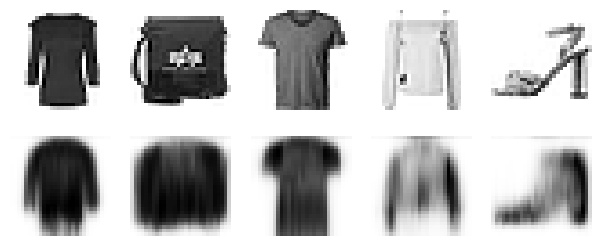

In [30]:
show_reconstructions(recurrent_ae)
plt.show()

# Stacked denoising Autoencoder

Using Gaussian noise:

In [31]:
tf.random.set_seed(100)
np.random.seed(100)

denoising_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.GaussianNoise(0.2),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu")
])
denoising_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
denoising_ae = keras.models.Sequential([denoising_encoder, denoising_decoder])
denoising_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
                     metrics=[rounded_accuracy])
history = denoising_ae.fit(X_train, X_train, epochs=10,
                           validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 14s 7ms/step - loss: 0.3493 - rounded_accuracy: 0.8782 - val_loss: 0.3198 - val_rounded_accuracy: 0.9080
Epoch 2/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3135 - rounded_accuracy: 0.9086 - val_loss: 0.3089 - val_rounded_accuracy: 0.9142
Epoch 3/10
1719/1719 [==============================] - 11s 7ms/step - loss: 0.3063 - rounded_accuracy: 0.9148 - val_loss: 0.3040 - val_rounded_accuracy: 0.9203
Epoch 4/10
1719/1719 [==============================] - 11s 7ms/step - loss: 0.3024 - rounded_accuracy: 0.9181 - val_loss: 0.3004 - val_rounded_accuracy: 0.9225
Epoch 5/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.2997 - rounded_accuracy: 0.9204 - val_loss: 0.2984 - val_rounded_accuracy: 0.9214
Epoch 6/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.2978 - rounded_accuracy: 0.9220 - val_loss: 0.2961 - val_rounded_accuracy: 0.9255
Epoch 7/10
1719/1719 [============

1/1 [==============================] - 0s 154ms/step


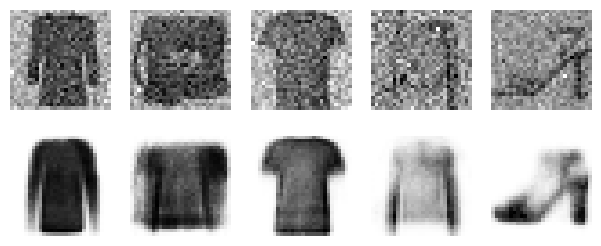

In [32]:
tf.random.set_seed(100)
np.random.seed(100)

noise = keras.layers.GaussianNoise(0.2)
show_reconstructions(denoising_ae, noise(X_valid, training=True))
plt.show()

Using dropout:

In [33]:
tf.random.set_seed(100)
np.random.seed(100)

dropout_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu"),
])
dropout_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
dropout_ae = keras.models.Sequential([dropout_encoder, dropout_decoder])
dropout_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
                   metrics=[rounded_accuracy])
history = dropout_ae.fit(X_train, X_train, epochs=10,
                         validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 12s 6ms/step - loss: 0.3567 - rounded_accuracy: 0.8713 - val_loss: 0.3211 - val_rounded_accuracy: 0.9047
Epoch 2/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3189 - rounded_accuracy: 0.9024 - val_loss: 0.3122 - val_rounded_accuracy: 0.9105
Epoch 3/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3126 - rounded_accuracy: 0.9075 - val_loss: 0.3072 - val_rounded_accuracy: 0.9149
Epoch 4/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3087 - rounded_accuracy: 0.9107 - val_loss: 0.3039 - val_rounded_accuracy: 0.9171
Epoch 5/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3063 - rounded_accuracy: 0.9126 - val_loss: 0.3020 - val_rounded_accuracy: 0.9194
Epoch 6/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.3046 - rounded_accuracy: 0.9140 - val_loss: 0.3005 - val_rounded_accuracy: 0.9210
Epoch 7/10
1719/1719 [============

1/1 [==============================] - 0s 113ms/step
Saving figure dropout_denoising_plot


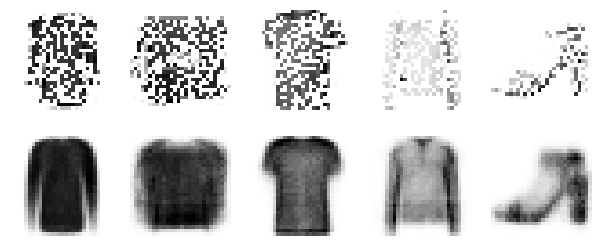

In [34]:
tf.random.set_seed(100)
np.random.seed(100)

dropout = keras.layers.Dropout(0.5)
show_reconstructions(dropout_ae, dropout(X_valid, training=True))
save_fig("dropout_denoising_plot", tight_layout=False)

# Sparse Autoencoder

Let's build a simple stacked autoencoder, so we can compare it to the sparse autoencoders we will build. This time we will use the sigmoid activation function for the coding layer, to ensure that the coding values range from 0 to 1:

In [35]:
tf.random.set_seed(100)
np.random.seed(100)

simple_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="sigmoid"),
])
simple_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
simple_ae = keras.models.Sequential([simple_encoder, simple_decoder])
simple_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.),
                  metrics=[rounded_accuracy])
history = simple_ae.fit(X_train, X_train, epochs=10,
                        validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 10s 5ms/step - loss: 0.4329 - rounded_accuracy: 0.7961 - val_loss: 0.3783 - val_rounded_accuracy: 0.8474
Epoch 2/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3630 - rounded_accuracy: 0.8646 - val_loss: 0.3545 - val_rounded_accuracy: 0.8762
Epoch 3/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3432 - rounded_accuracy: 0.8838 - val_loss: 0.3388 - val_rounded_accuracy: 0.8875
Epoch 4/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3292 - rounded_accuracy: 0.8956 - val_loss: 0.3257 - val_rounded_accuracy: 0.8993
Epoch 5/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3209 - rounded_accuracy: 0.9016 - val_loss: 0.3209 - val_rounded_accuracy: 0.9041
Epoch 6/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3172 - rounded_accuracy: 0.9044 - val_loss: 0.3195 - val_rounded_accuracy: 0.9071
Epoch 7/10
1719/1719 [================

1/1 [==============================] - 0s 102ms/step


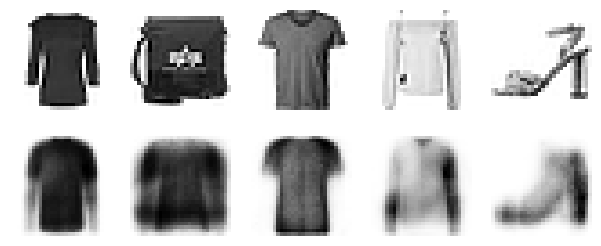

In [36]:
show_reconstructions(simple_ae)
plt.show()

Let's create a couple functions to print nice activation histograms:

In [37]:
def plot_percent_hist(ax, data, bins):
    counts, _ = np.histogram(data, bins=bins)
    widths = bins[1:] - bins[:-1]
    x = bins[:-1] + widths / 2
    ax.bar(x, counts / len(data), width=widths*0.8)
    ax.xaxis.set_ticks(bins)
    ax.yaxis.set_major_formatter(mpl.ticker.FuncFormatter(
        lambda y, position: "{}%".format(int(np.round(100 * y)))))
    ax.grid(True)

In [38]:
def plot_activations_histogram(encoder, height=1, n_bins=10):
    X_valid_codings = encoder(X_valid).numpy()
    activation_means = X_valid_codings.mean(axis=0)
    mean = activation_means.mean()
    bins = np.linspace(0, 1, n_bins + 1)
    
    fig, [ax1, ax2] = plt.subplots(figsize=(10, 3), nrows=1, ncols=2, sharey=True)
    plot_percent_hist(ax1, X_valid_codings.ravel(), bins)
    ax1.plot([mean, mean], [0, height], "k--", label="Overall Mean = {:.2f}".format(mean))
    ax1.legend(loc="upper center", fontsize=14)
    ax1.set_xlabel("Activation")
    ax1.set_ylabel("% Activations")
    ax1.axis([0, 1, 0, height])
    plot_percent_hist(ax2, activation_means, bins)
    ax2.plot([mean, mean], [0, height], "k--")
    ax2.set_xlabel("Neuron Mean Activation")
    ax2.set_ylabel("% Neurons")
    ax2.axis([0, 1, 0, height])

Let's use these functions to plot histograms of the activations of the encoding layer. The histogram on the left shows the distribution of all the activations. You can see that values close to 0 or 1 are more frequent overall, which is consistent with the saturating nature of the sigmoid function. The histogram on the right shows the distribution of mean neuron activations: you can see that most neurons have a mean activation close to 0.5. Both histograms tell us that each neuron tends to either fire close to 0 or 1, with about 50% probability each. However, some neurons fire almost all the time (right side of the right histogram).

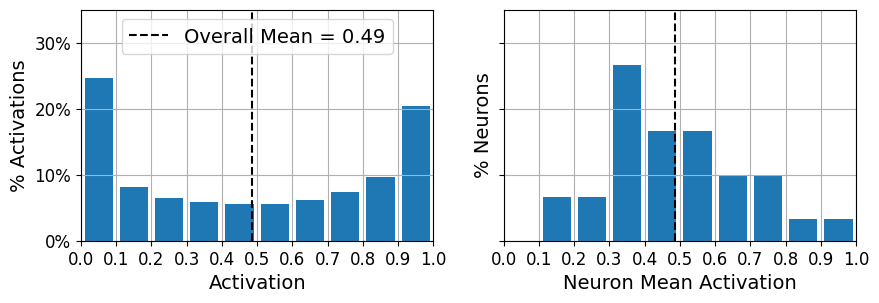

In [39]:
plot_activations_histogram(simple_encoder, height=0.35)
plt.show()

Now let's add $\ell_1$ regularization to the coding layer:

In [40]:
tf.random.set_seed(100)
np.random.seed(100)

sparse_l1_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(300, activation="sigmoid"),
    keras.layers.ActivityRegularization(l1=1e-3)
])
sparse_l1_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[300]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
sparse_l1_ae = keras.models.Sequential([sparse_l1_encoder, sparse_l1_decoder])
sparse_l1_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
                     metrics=[rounded_accuracy])
history = sparse_l1_ae.fit(X_train, X_train, epochs=10,
                           validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.4328 - rounded_accuracy: 0.8148 - val_loss: 0.3802 - val_rounded_accuracy: 0.8599
Epoch 2/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.3698 - rounded_accuracy: 0.8681 - val_loss: 0.3654 - val_rounded_accuracy: 0.8720
Epoch 3/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3580 - rounded_accuracy: 0.8773 - val_loss: 0.3558 - val_rounded_accuracy: 0.8766
Epoch 4/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.3463 - rounded_accuracy: 0.8852 - val_loss: 0.3437 - val_rounded_accuracy: 0.8889
Epoch 5/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3386 - rounded_accuracy: 0.8907 - val_loss: 0.3376 - val_rounded_accuracy: 0.8941
Epoch 6/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3332 - rounded_accuracy: 0.8954 - val_loss: 0.3329 - val_rounded_accuracy: 0.8979
Epoch 7/10
1719/1719 [============

1/1 [==============================] - 0s 109ms/step


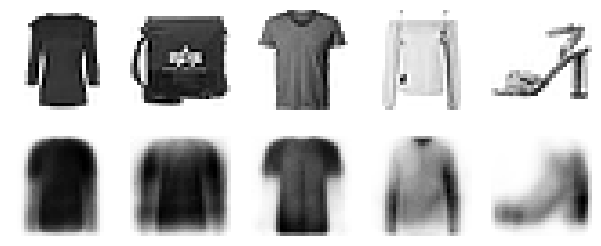

In [41]:
show_reconstructions(sparse_l1_ae)

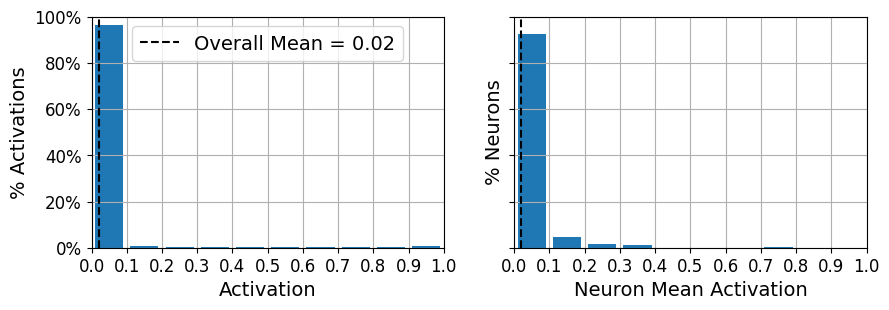

In [42]:
plot_activations_histogram(sparse_l1_encoder, height=1.)
plt.show()

Let's use the KL Divergence loss instead to ensure sparsity, and target 10% sparsity rather than 0%:

Saving figure sparsity_loss_plot


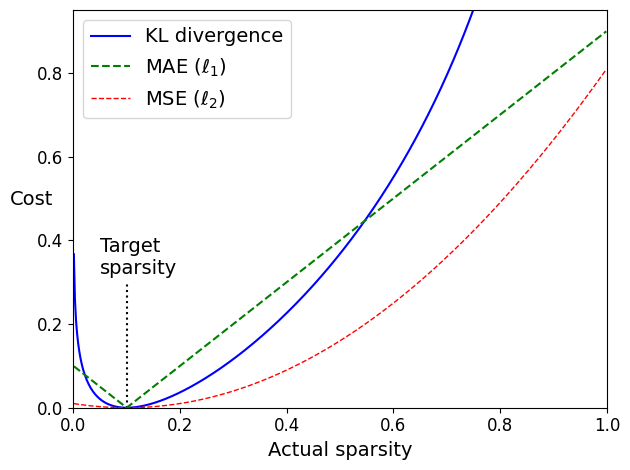

In [43]:
p = 0.1
q = np.linspace(0.001, 0.999, 500)
kl_div = p * np.log(p / q) + (1 - p) * np.log((1 - p) / (1 - q))
mse = (p - q)**2
mae = np.abs(p - q)
plt.plot([p, p], [0, 0.3], "k:")
plt.text(0.05, 0.32, "Target\nsparsity", fontsize=14)
plt.plot(q, kl_div, "b-", label="KL divergence")
plt.plot(q, mae, "g--", label=r"MAE ($\ell_1$)")
plt.plot(q, mse, "r--", linewidth=1, label=r"MSE ($\ell_2$)")
plt.legend(loc="upper left", fontsize=14)
plt.xlabel("Actual sparsity")
plt.ylabel("Cost", rotation=0)
plt.axis([0, 1, 0, 0.95])
save_fig("sparsity_loss_plot")

In [44]:
K = keras.backend
kl_divergence = keras.losses.kullback_leibler_divergence

class KLDivergenceRegularizer(keras.regularizers.Regularizer):
    def __init__(self, weight, target=0.1):
        self.weight = weight
        self.target = target
    def __call__(self, inputs):
        mean_activities = K.mean(inputs, axis=0)
        return self.weight * (
            kl_divergence(self.target, mean_activities) +
            kl_divergence(1. - self.target, 1. - mean_activities))

In [45]:
tf.random.set_seed(42)
np.random.seed(42)

kld_reg = KLDivergenceRegularizer(weight=0.05, target=0.1)
sparse_kl_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(300, activation="sigmoid", activity_regularizer=kld_reg)
])
sparse_kl_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[300]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
sparse_kl_ae = keras.models.Sequential([sparse_kl_encoder, sparse_kl_decoder])
sparse_kl_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
              metrics=[rounded_accuracy])
history = sparse_kl_ae.fit(X_train, X_train, epochs=10,
                           validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 10s 5ms/step - loss: 0.4119 - rounded_accuracy: 0.8155 - val_loss: 0.3698 - val_rounded_accuracy: 0.8605
Epoch 2/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3515 - rounded_accuracy: 0.8781 - val_loss: 0.3428 - val_rounded_accuracy: 0.8863
Epoch 3/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3328 - rounded_accuracy: 0.8931 - val_loss: 0.3281 - val_rounded_accuracy: 0.8986
Epoch 4/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3216 - rounded_accuracy: 0.9028 - val_loss: 0.3207 - val_rounded_accuracy: 0.9050
Epoch 5/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3164 - rounded_accuracy: 0.9070 - val_loss: 0.3165 - val_rounded_accuracy: 0.9087
Epoch 6/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3127 - rounded_accuracy: 0.9102 - val_loss: 0.3129 - val_rounded_accuracy: 0.9111
Epoch 7/10
1719/1719 [===============

1/1 [==============================] - 0s 131ms/step


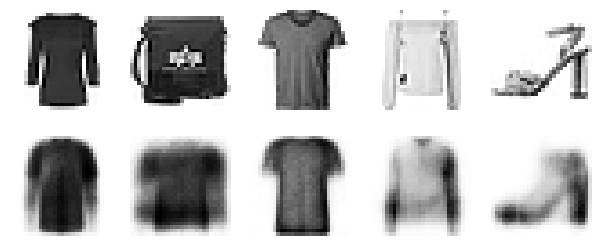

In [46]:
show_reconstructions(sparse_kl_ae)

Saving figure sparse_autoencoder_plot


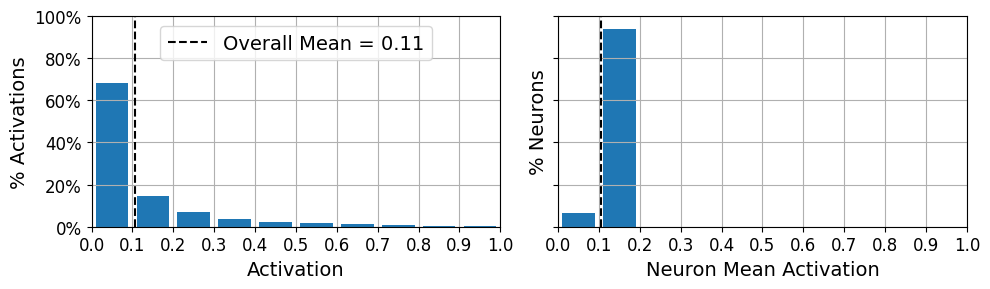

In [47]:
plot_activations_histogram(sparse_kl_encoder)
save_fig("sparse_autoencoder_plot")
plt.show()

# Variational Autoencoder

In [48]:
class Sampling(keras.layers.Layer):
    def call(self, inputs):
        mean, log_var = inputs
        return K.random_normal(tf.shape(log_var)) * K.exp(log_var / 2) + mean

In [49]:
tf.random.set_seed(100)
np.random.seed(100)

codings_size = 10

inputs = keras.layers.Input(shape=[28, 28])
z = keras.layers.Flatten()(inputs)
z = keras.layers.Dense(150, activation="selu")(z)
z = keras.layers.Dense(100, activation="selu")(z)
codings_mean = keras.layers.Dense(codings_size)(z)
codings_log_var = keras.layers.Dense(codings_size)(z)
codings = Sampling()([codings_mean, codings_log_var])
variational_encoder = keras.models.Model(
    inputs=[inputs], outputs=[codings_mean, codings_log_var, codings])

decoder_inputs = keras.layers.Input(shape=[codings_size])
x = keras.layers.Dense(100, activation="selu")(decoder_inputs)
x = keras.layers.Dense(150, activation="selu")(x)
x = keras.layers.Dense(28 * 28, activation="sigmoid")(x)
outputs = keras.layers.Reshape([28, 28])(x)
variational_decoder = keras.models.Model(inputs=[decoder_inputs], outputs=[outputs])

_, _, codings = variational_encoder(inputs)
reconstructions = variational_decoder(codings)
variational_ae = keras.models.Model(inputs=[inputs], outputs=[reconstructions])

latent_loss = -0.5 * K.sum(
    1 + codings_log_var - K.exp(codings_log_var) - K.square(codings_mean),
    axis=-1)
variational_ae.add_loss(K.mean(latent_loss) / 784.)
variational_ae.compile(loss="binary_crossentropy", optimizer="rmsprop", metrics=[rounded_accuracy])
history = variational_ae.fit(X_train, X_train, epochs=25, batch_size=128,
                             validation_data=(X_valid, X_valid))

Epoch 1/25
430/430 [==============================] - 8s 13ms/step - loss: 0.3893 - rounded_accuracy: 0.8608 - val_loss: 0.3521 - val_rounded_accuracy: 0.8883
Epoch 2/25
430/430 [==============================] - 5s 12ms/step - loss: 0.3426 - rounded_accuracy: 0.8975 - val_loss: 0.3394 - val_rounded_accuracy: 0.9043
Epoch 3/25
430/430 [==============================] - 6s 13ms/step - loss: 0.3323 - rounded_accuracy: 0.9055 - val_loss: 0.3375 - val_rounded_accuracy: 0.8914
Epoch 4/25
430/430 [==============================] - 6s 13ms/step - loss: 0.3272 - rounded_accuracy: 0.9093 - val_loss: 0.3271 - val_rounded_accuracy: 0.9084
Epoch 5/25
430/430 [==============================] - 6s 13ms/step - loss: 0.3241 - rounded_accuracy: 0.9119 - val_loss: 0.3239 - val_rounded_accuracy: 0.9147
Epoch 6/25
430/430 [==============================] - 6s 13ms/step - loss: 0.3221 - rounded_accuracy: 0.9137 - val_loss: 0.3225 - val_rounded_accuracy: 0.9155
Epoch 7/25
430/430 [==========================

1/1 [==============================] - 0s 243ms/step


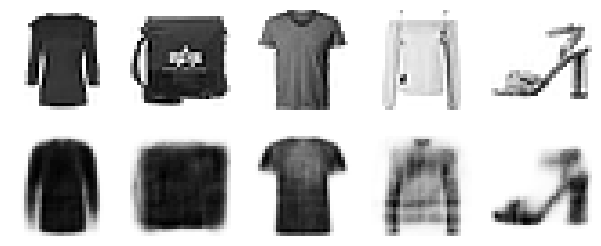

In [50]:
show_reconstructions(variational_ae)
plt.show()

## Generate Fashion Images

In [51]:
def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = np.squeeze(images, axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

Let's generate a few random codings, decode them and plot the resulting images:

Saving figure vae_generated_images_plot


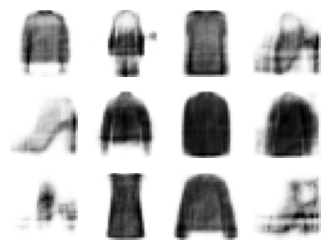

In [52]:
tf.random.set_seed(100)

codings = tf.random.normal(shape=[12, codings_size])
images = variational_decoder(codings).numpy()
plot_multiple_images(images, 4)
save_fig("vae_generated_images_plot", tight_layout=False)

Now let's perform semantic interpolation between these images:

Saving figure semantic_interpolation_plot


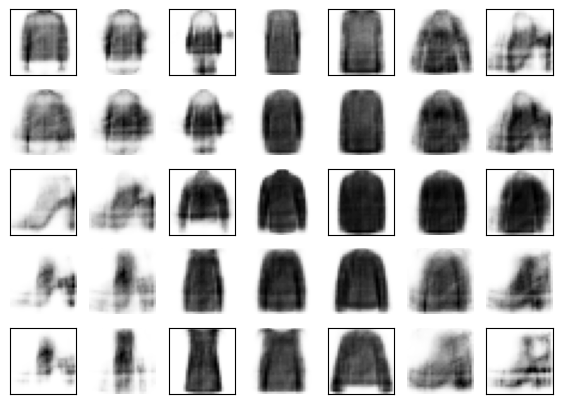

In [53]:
tf.random.set_seed(42)
np.random.seed(42)

codings_grid = tf.reshape(codings, [1, 3, 4, codings_size])
larger_grid = tf.image.resize(codings_grid, size=[5, 7])
interpolated_codings = tf.reshape(larger_grid, [-1, codings_size])
images = variational_decoder(interpolated_codings).numpy()

plt.figure(figsize=(7, 5))
for index, image in enumerate(images):
    plt.subplot(5, 7, index + 1)
    if index%7%2==0 and index//7%2==0:
        plt.gca().get_xaxis().set_visible(False)
        plt.gca().get_yaxis().set_visible(False)
    else:
        plt.axis("off")
    plt.imshow(image, cmap="binary")
save_fig("semantic_interpolation_plot", tight_layout=False)

# Generative Adversarial Networks

In [54]:
np.random.seed(100)
tf.random.set_seed(100)

codings_size = 30

generator = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[codings_size]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
discriminator = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(1, activation="sigmoid")
])
gan = keras.models.Sequential([generator, discriminator])

In [55]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [56]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

In [57]:
def train_gan(gan, dataset, batch_size, codings_size, n_epochs=50):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))              # not shown in the book
        for X_batch in dataset:
            # phase 1 - training the discriminator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.trainable = True
            discriminator.train_on_batch(X_fake_and_real, y1)
            # phase 2 - training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            discriminator.trainable = False
            gan.train_on_batch(noise, y2)
        plot_multiple_images(generated_images, 8)                     # not shown
        plt.show()                                                    # not shown

Epoch 1/1


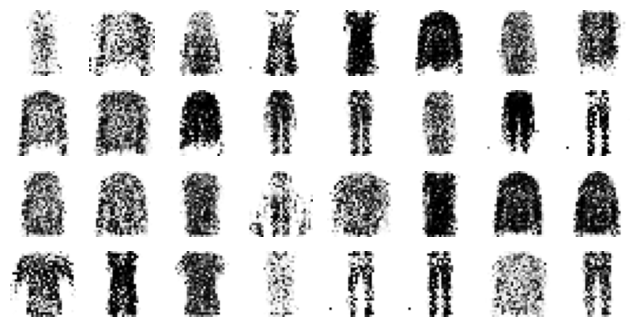

In [58]:
train_gan(gan, dataset, batch_size, codings_size, n_epochs=1)

Saving figure gan_generated_images_plot


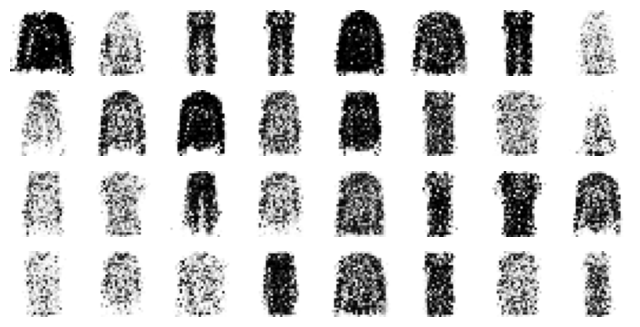

In [59]:
tf.random.set_seed(100)
np.random.seed(100)

noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator(noise)
plot_multiple_images(generated_images, 8)
save_fig("gan_generated_images_plot", tight_layout=False)

Epoch 1/50


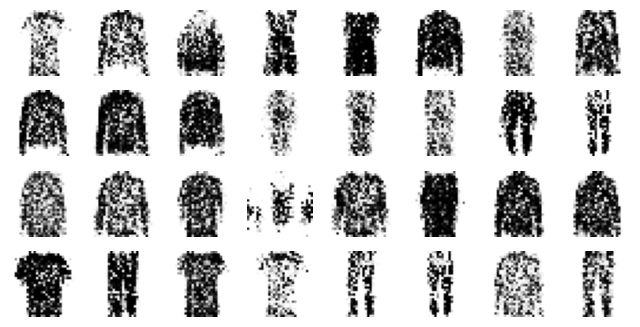

Epoch 2/50


2024-11-03 07:49:51.205351: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 07:49:57.513855: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 07:50:00.369955: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 07:50:18.425060: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 07:50:31.445091: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 07:50:35.577235: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


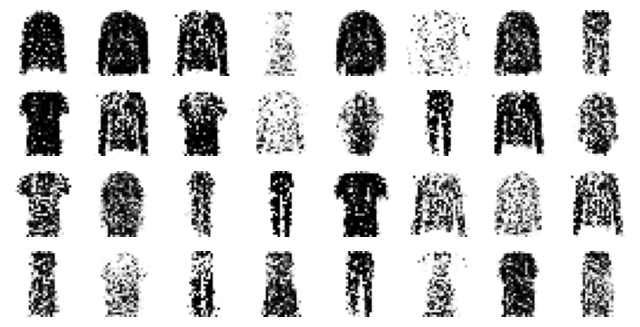

Epoch 3/50


2024-11-03 07:51:00.088589: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


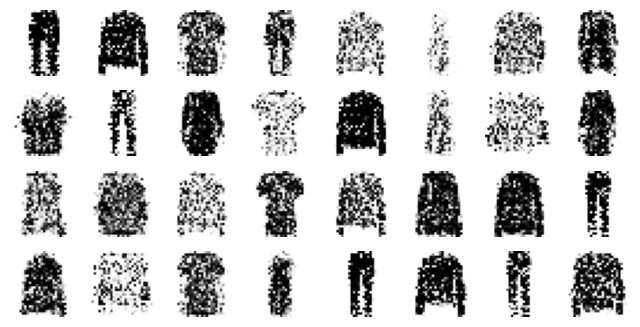

Epoch 4/50


2024-11-03 07:52:00.677499: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


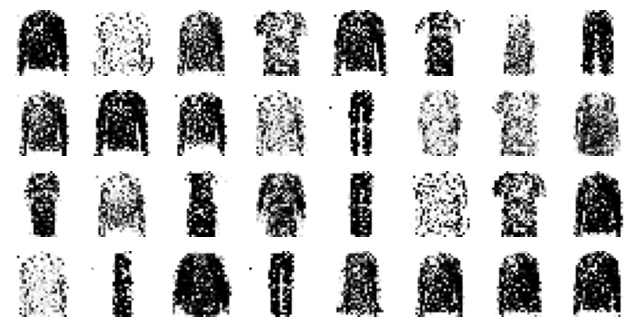

Epoch 5/50


2024-11-03 07:53:27.369529: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 07:53:32.128774: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 07:53:36.218191: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


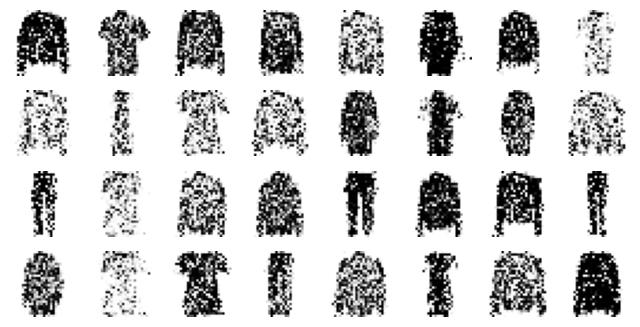

Epoch 6/50


2024-11-03 07:54:12.711562: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 07:54:27.336508: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 07:54:30.997563: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 07:54:36.958541: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 07:54:37.166425: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


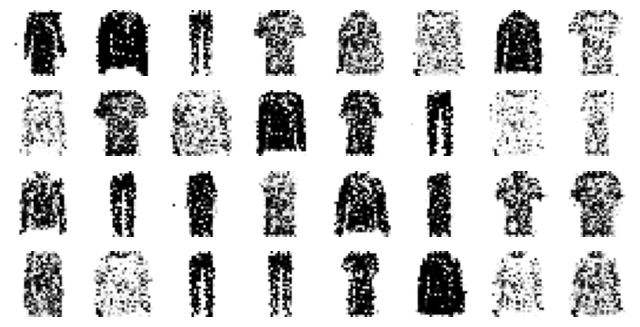

Epoch 7/50


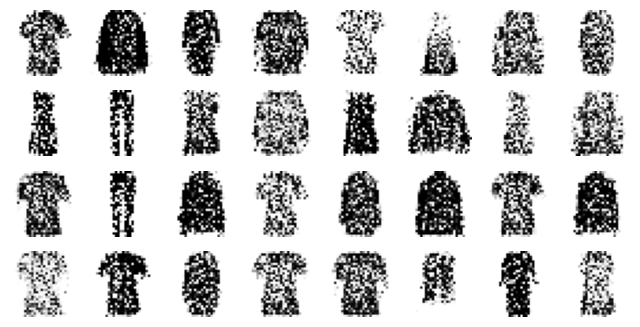

Epoch 8/50


2024-11-03 07:56:01.198308: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 07:56:44.082337: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


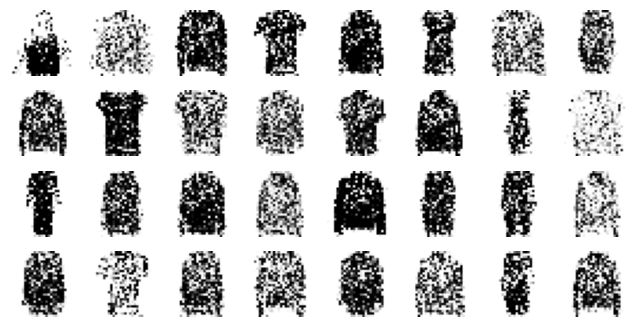

Epoch 9/50


2024-11-03 07:57:13.597259: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 07:57:31.306705: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


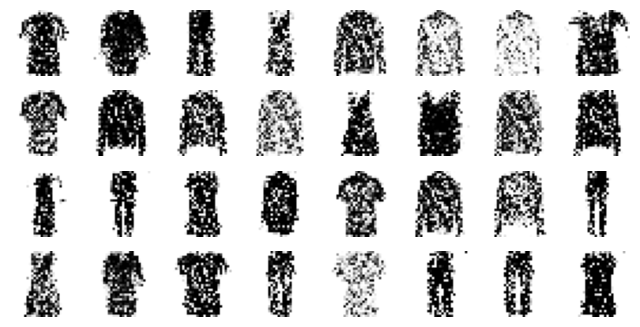

Epoch 10/50


2024-11-03 07:58:41.913287: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 07:59:01.150685: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


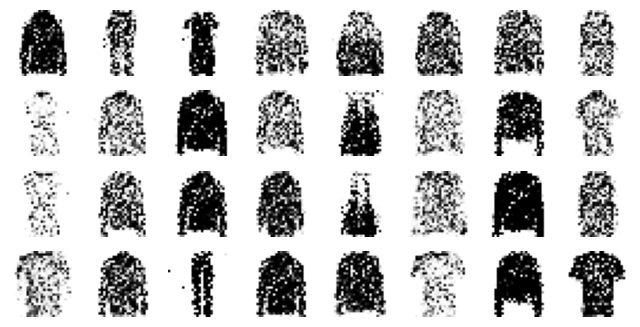

Epoch 11/50


2024-11-03 08:00:00.471800: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:00:01.176060: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:00:01.666528: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:00:03.535104: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:00:19.966801: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


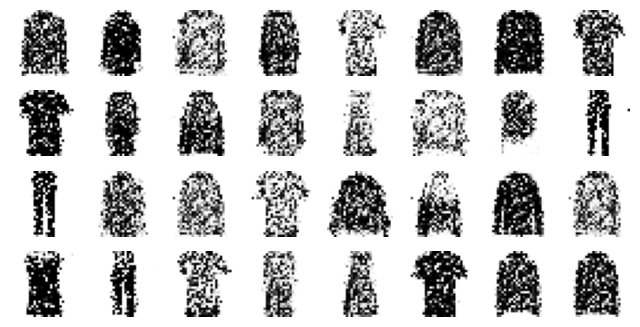

Epoch 12/50


2024-11-03 08:00:39.961085: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:01:01.694624: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


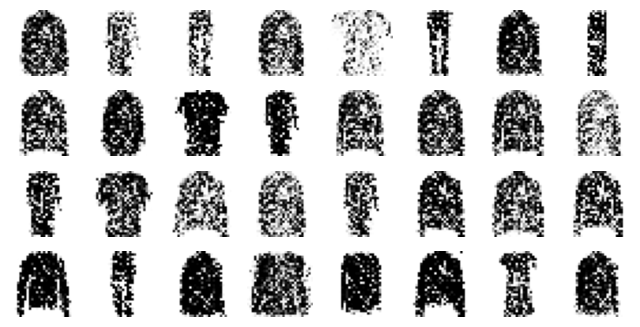

Epoch 13/50


2024-11-03 08:01:59.342516: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:02:03.020807: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


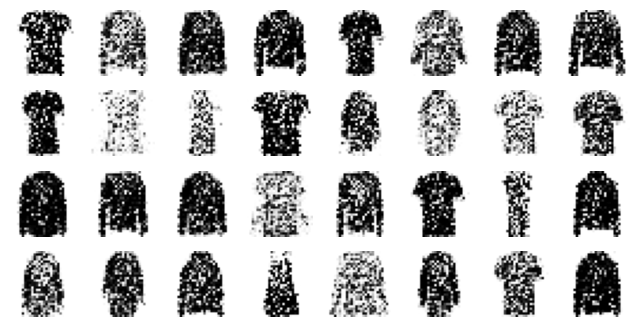

Epoch 14/50


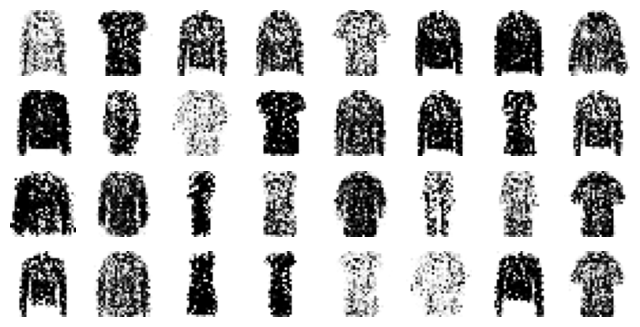

Epoch 15/50


2024-11-03 08:04:20.895871: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:04:25.470169: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:04:43.074458: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


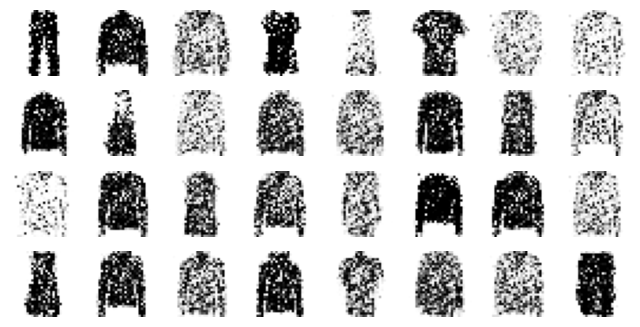

Epoch 16/50


2024-11-03 08:05:54.345996: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:06:01.555240: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


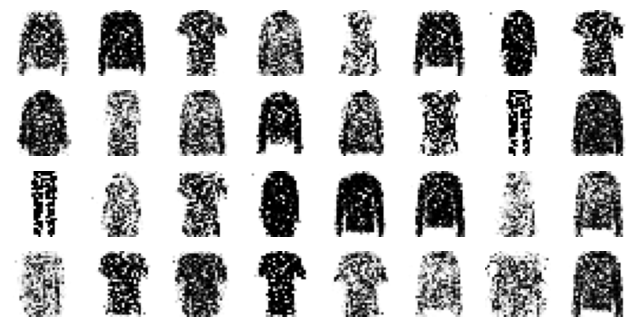

Epoch 17/50


2024-11-03 08:06:05.195110: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:06:11.326528: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:06:15.321278: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:06:20.757267: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:06:43.114328: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:07:01.428886: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


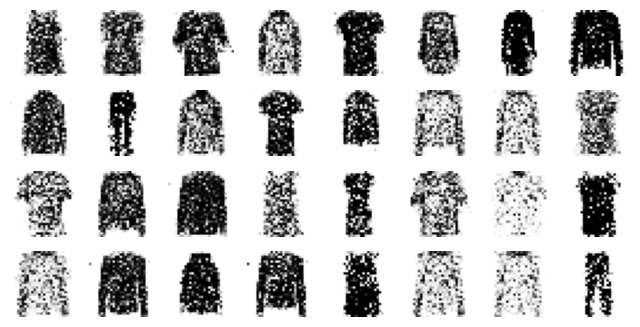

Epoch 18/50


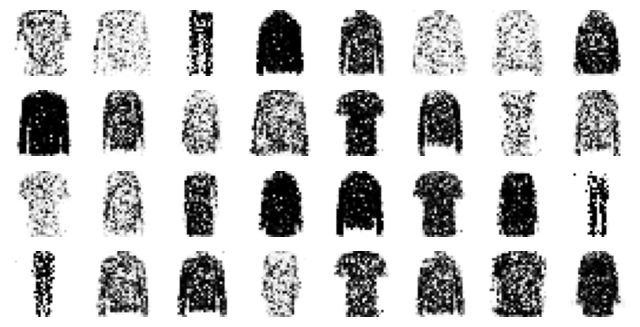

Epoch 19/50


2024-11-03 08:09:31.542002: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


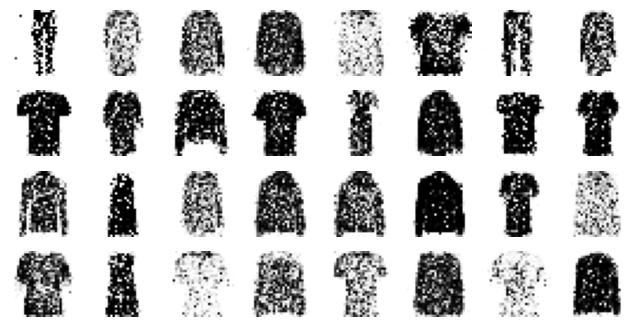

Epoch 20/50


2024-11-03 08:10:18.856785: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:10:22.436506: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


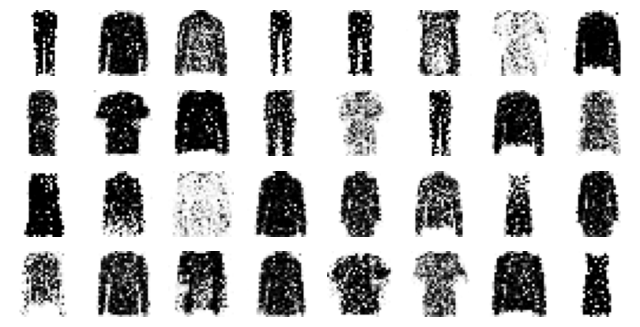

Epoch 21/50


2024-11-03 08:11:44.239656: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


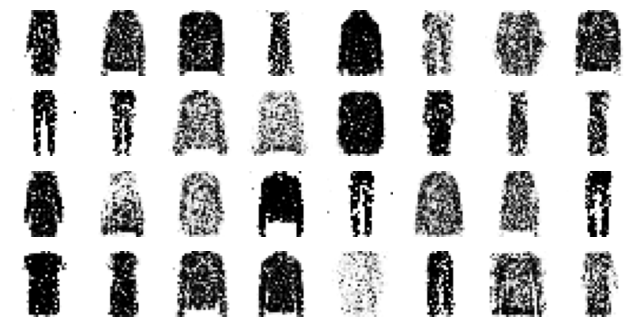

Epoch 22/50


2024-11-03 08:12:21.597742: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


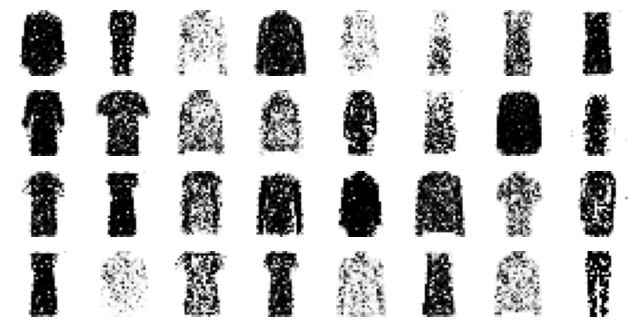

Epoch 23/50


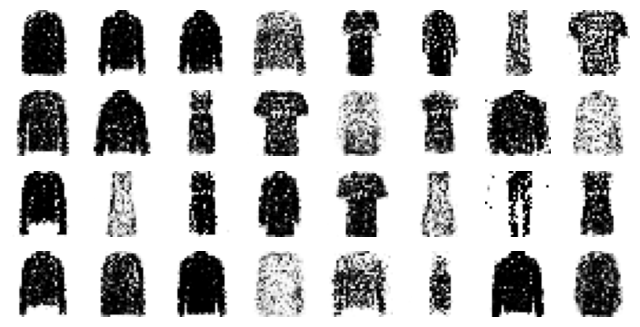

Epoch 24/50


2024-11-03 08:14:04.114867: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:14:37.626222: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


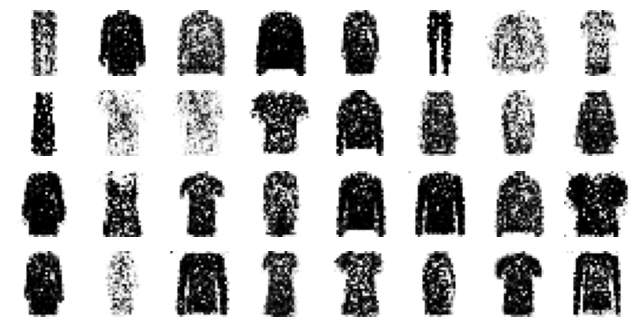

Epoch 25/50


2024-11-03 08:15:21.709739: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


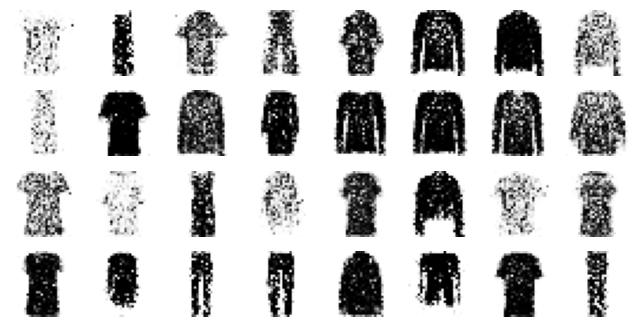

Epoch 26/50


2024-11-03 08:16:41.799040: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


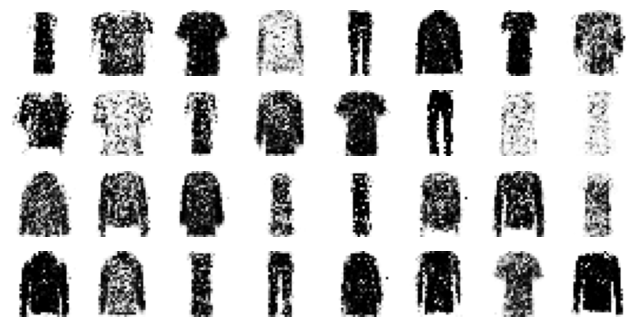

Epoch 27/50


2024-11-03 08:17:02.443057: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:17:20.814167: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


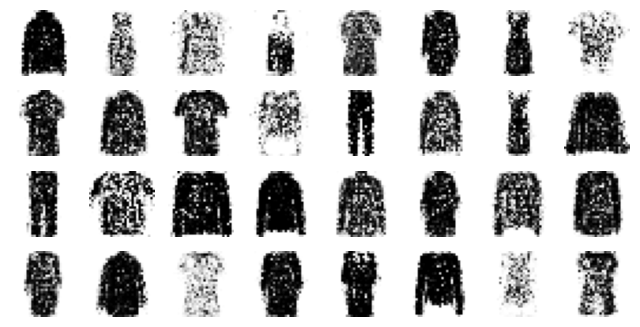

Epoch 28/50


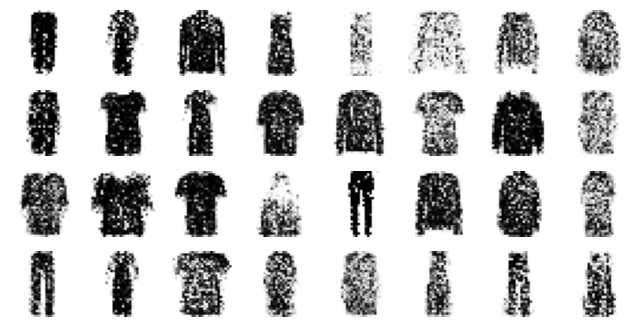

Epoch 29/50


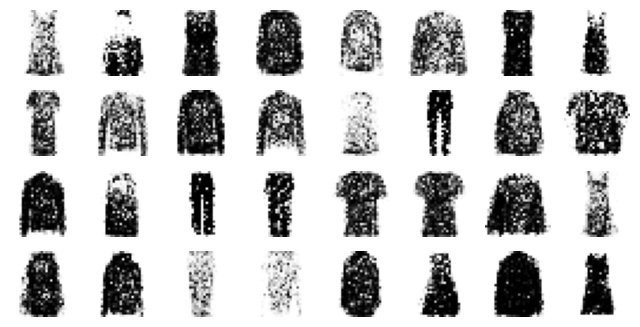

Epoch 30/50


2024-11-03 08:20:12.299844: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:20:27.589252: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


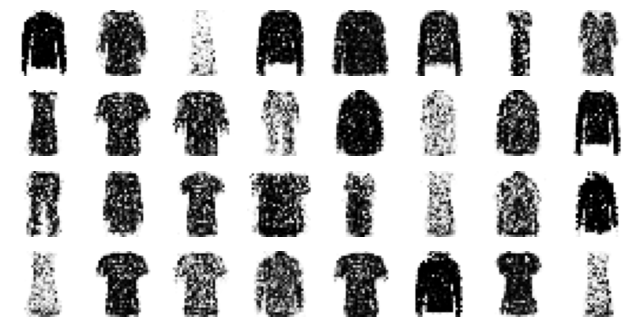

Epoch 31/50


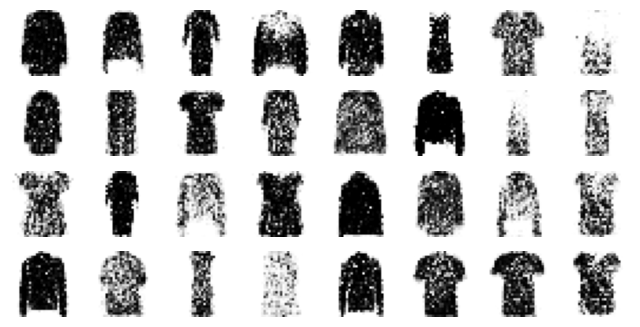

Epoch 32/50


2024-11-03 08:22:29.593409: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:22:29.677262: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:22:37.158366: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


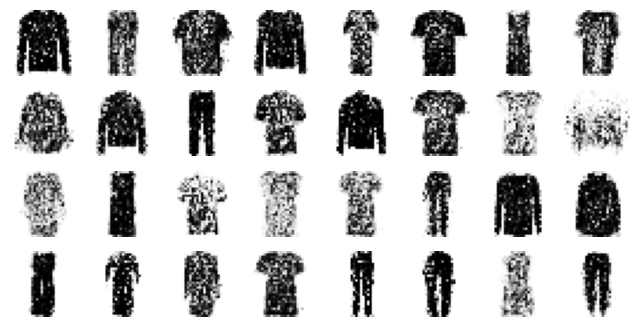

Epoch 33/50


2024-11-03 08:24:00.182920: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:24:01.449950: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


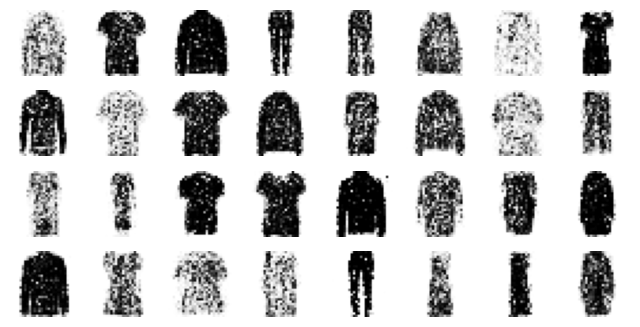

Epoch 34/50


2024-11-03 08:24:40.096828: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


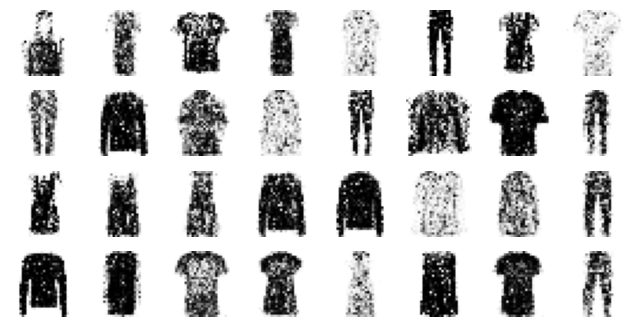

Epoch 35/50


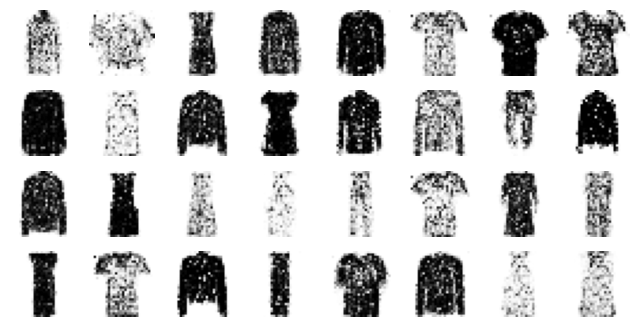

Epoch 36/50


2024-11-03 08:26:34.573140: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:26:34.765246: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


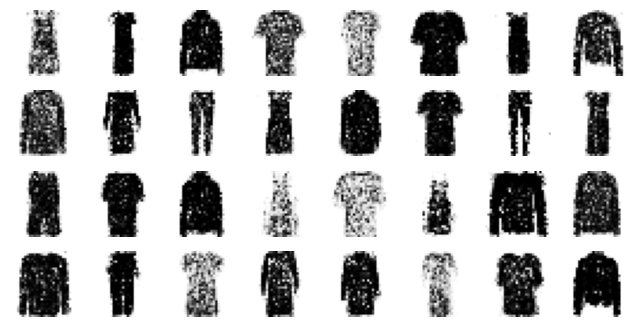

Epoch 37/50


2024-11-03 08:28:37.721230: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:28:37.801228: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:28:37.949316: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


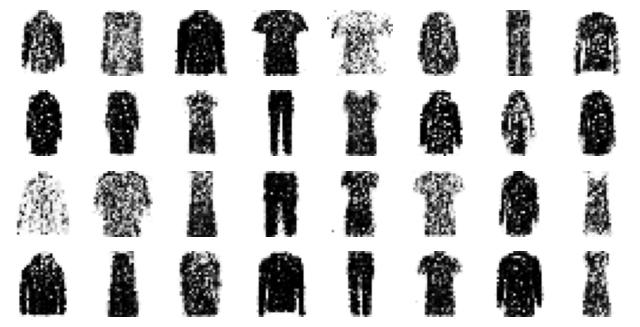

Epoch 38/50


2024-11-03 08:29:14.866763: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


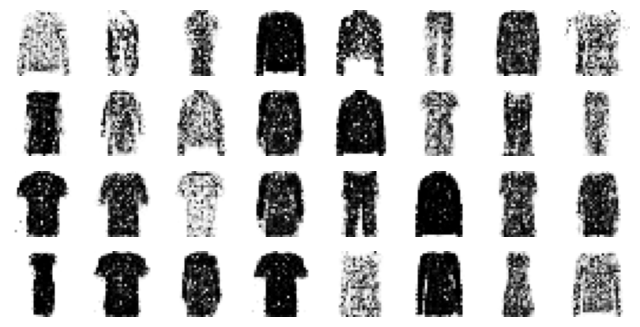

Epoch 39/50


2024-11-03 08:30:40.669248: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:30:40.849293: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:30:57.255283: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:31:02.095513: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


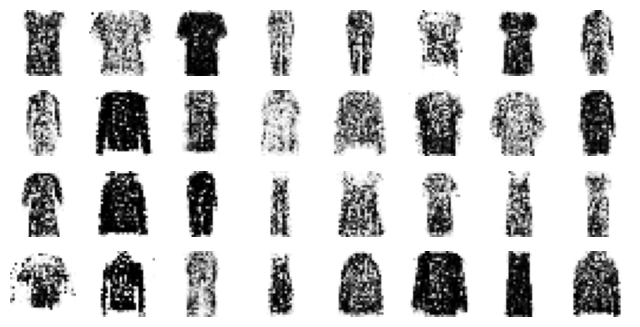

Epoch 40/50


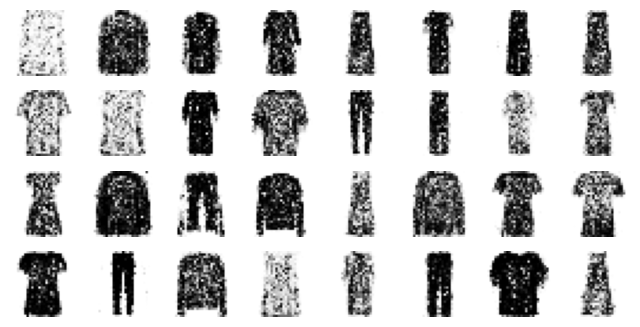

Epoch 41/50


2024-11-03 08:32:21.551137: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled
2024-11-03 08:32:22.103812: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


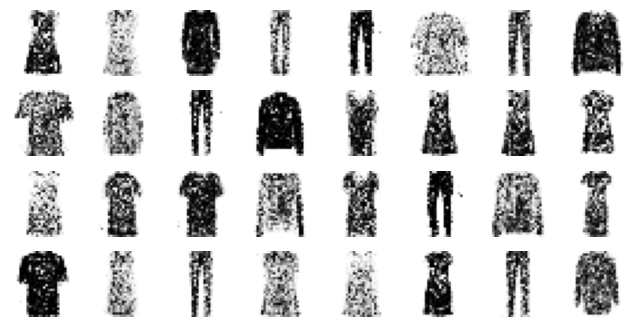

Epoch 42/50


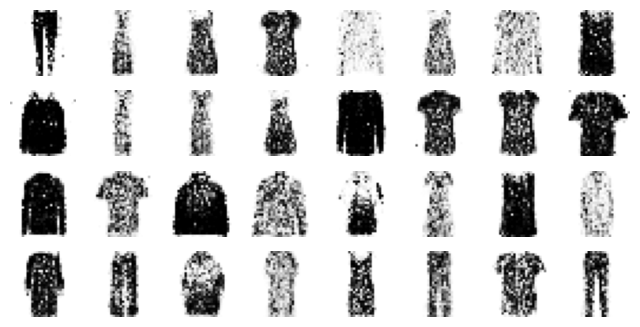

Epoch 43/50


2024-11-03 08:34:46.797297: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


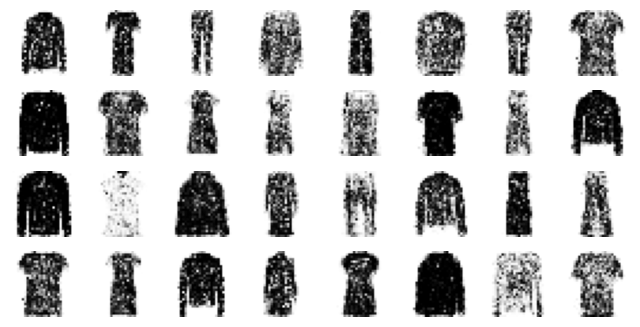

Epoch 44/50


2024-11-03 08:36:32.019222: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


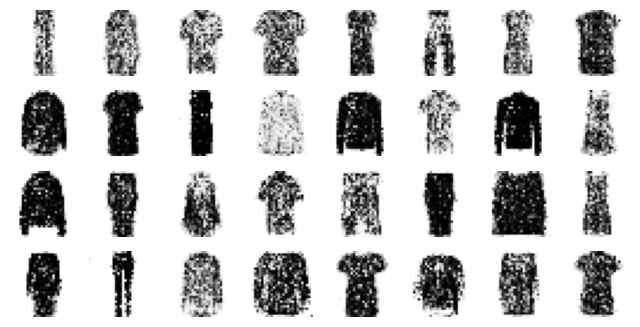

Epoch 45/50


2024-11-03 08:37:51.558934: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


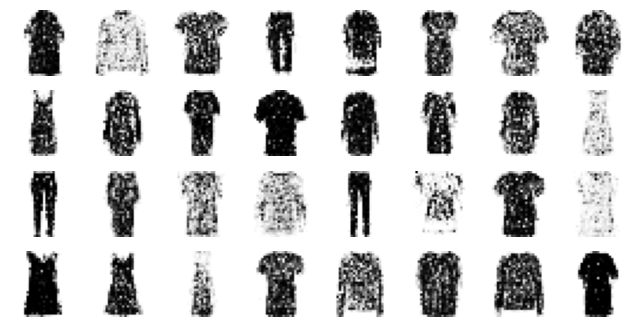

Epoch 46/50


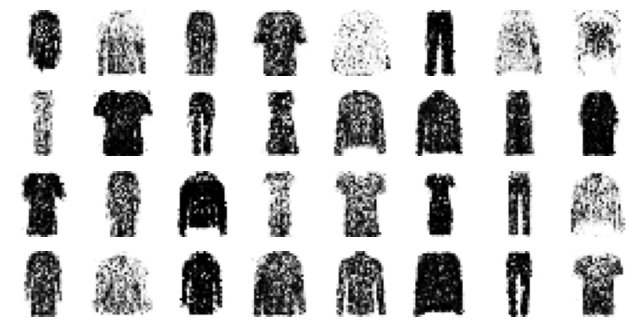

Epoch 47/50


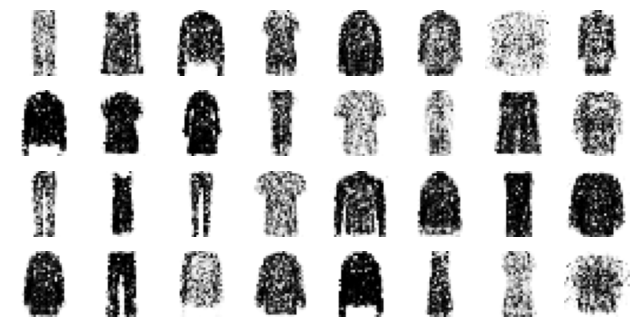

Epoch 48/50


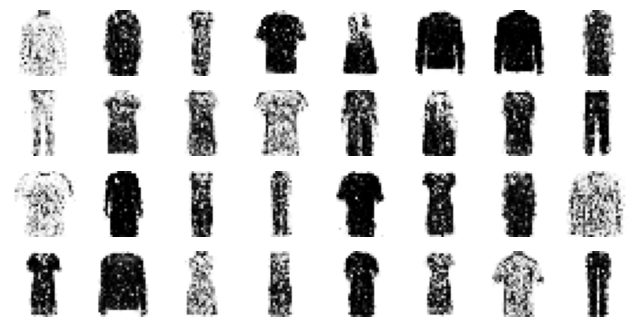

Epoch 49/50


2024-11-03 08:40:55.845281: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


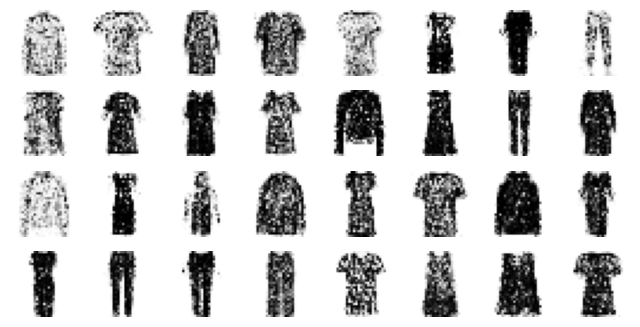

Epoch 50/50


2024-11-03 08:42:05.669444: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


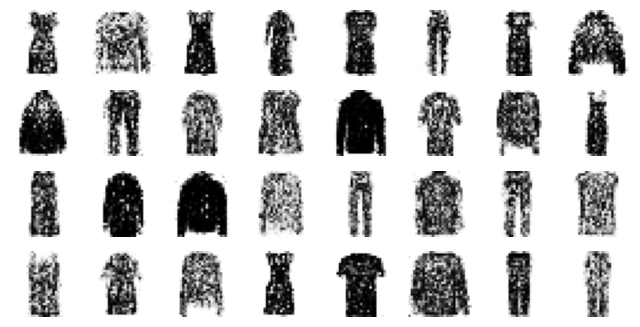

In [60]:
train_gan(gan, dataset, batch_size, codings_size)

# Deep Convolutional GAN

In [61]:
tf.random.set_seed(100)
np.random.seed(100)

codings_size = 100

generator = keras.models.Sequential([
    keras.layers.Dense(7 * 7 * 128, input_shape=[codings_size]),
    keras.layers.Reshape([7, 7, 128]),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="SAME",
                                activation="selu"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2, padding="SAME",
                                 activation="tanh"),
])
discriminator = keras.models.Sequential([
    keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="SAME",
                        activation=keras.layers.LeakyReLU(0.2),
                        input_shape=[28, 28, 1]),
    keras.layers.Dropout(0.4),
    keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="SAME",
                        activation=keras.layers.LeakyReLU(0.2)),
    keras.layers.Dropout(0.4),
    keras.layers.Flatten(),
    keras.layers.Dense(1, activation="sigmoid")
])
gan = keras.models.Sequential([generator, discriminator])

In [62]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [63]:
X_train_dcgan = X_train.reshape(-1, 28, 28, 1) * 2. - 1. # reshape and rescale

In [64]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

Epoch 1/50


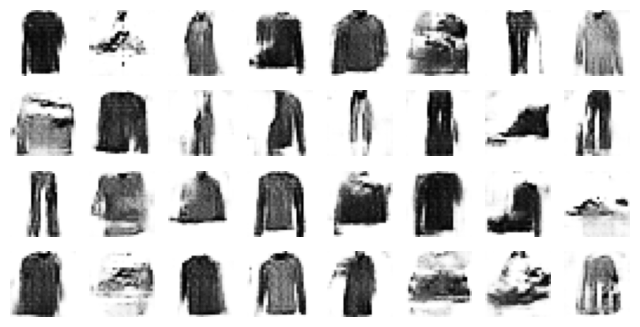

Epoch 2/50


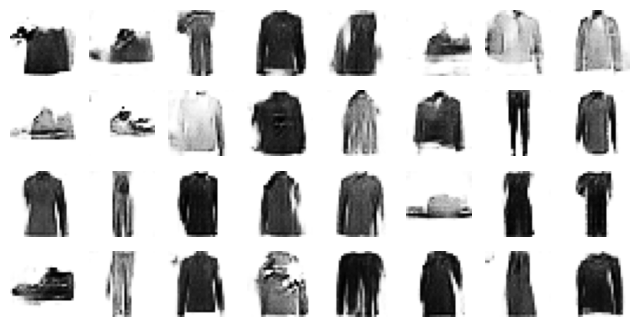

Epoch 3/50


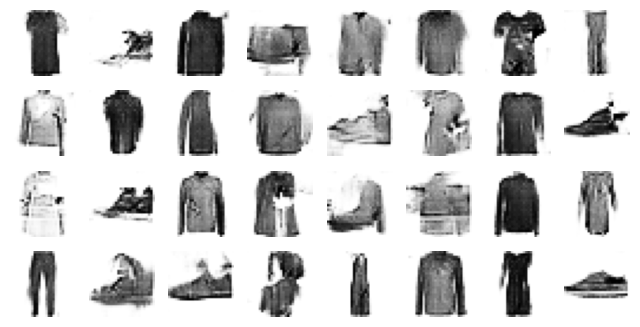

Epoch 4/50


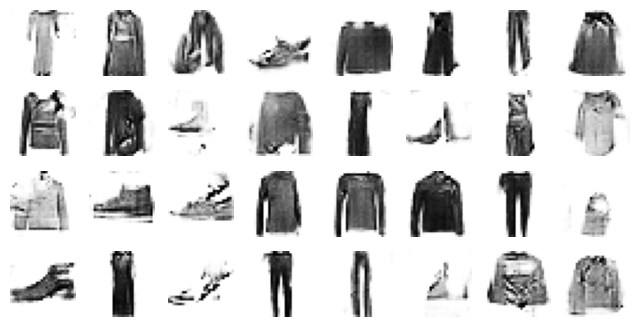

Epoch 5/50


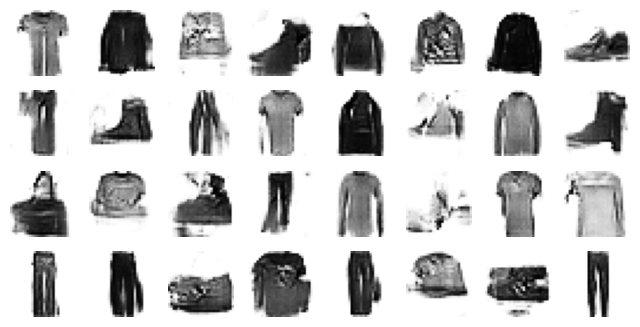

Epoch 6/50


In [ ]:
train_gan(gan, dataset, batch_size, codings_size)

In [ ]:
tf.random.set_seed(100)
np.random.seed(100)

noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator(noise)
plot_multiple_images(generated_images, 8)
save_fig("dcgan_generated_images_plot", tight_layout=False)

# Extra Material

## Hashing Using a Binary Autoencoder

Let's load the Fashion MNIST dataset again:

In [ ]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train_full = X_train_full.astype(np.float32) / 255
X_test = X_test.astype(np.float32) / 255
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

Let's train an autoencoder where the encoder has a 16-neuron output layer, using the sigmoid activation function, and heavy Gaussian noise just before it. During training, the noise layer will encourage the previous layer to learn to output large values, since small values will just be crushed by the noise. In turn, this means that the output layer will output values close to 0 or 1, thanks to the sigmoid activation function. Once we round the output values to 0s and 1s, we get a 16-bit "semantic" hash. If everything works well, images that look alike will have the same hash. This can be very useful for search engines: for example, if we store each image on a server identified by the image's semantic hash, then all similar images will end up on the same server. Users of the search engine can then provide an image to search for, and the search engine will compute the image's hash using the encoder, and quickly return all the images on the server identified by that hash.

In [ ]:
tf.random.set_seed(100)
np.random.seed(100)

hashing_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.GaussianNoise(15.),
    keras.layers.Dense(16, activation="sigmoid"),
])
hashing_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[16]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
hashing_ae = keras.models.Sequential([hashing_encoder, hashing_decoder])
hashing_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.Nadam(),
                   metrics=[rounded_accuracy])
history = hashing_ae.fit(X_train, X_train, epochs=10,
                         validation_data=(X_valid, X_valid))

The autoencoder compresses the information so much (down to 16 bits!) that it's quite lossy, but that's okay, we're using it to produce semantic hashes, not to perfectly reconstruct the images:

In [ ]:
show_reconstructions(hashing_ae)
plt.show()

Notice that the outputs are indeed very close to 0 or 1 (left graph):

In [ ]:
plot_activations_histogram(hashing_encoder)
plt.show()

Now let's see what the hashes look like for the first few images in the validation set:

In [ ]:
hashes = np.round(hashing_encoder.predict(X_valid)).astype(np.int32)
hashes *= np.array([[2**bit for bit in range(16)]])
hashes = hashes.sum(axis=1)
for h in hashes[:5]:
    print("{:016b}".format(h))
print("...")

Now let's find the most common image hashes in the validation set, and display a few images for each hash. In the following image, all the images on a given row have the same hash:

In [ ]:
from collections import Counter

n_hashes = 10
n_images = 8

top_hashes = Counter(hashes).most_common(n_hashes)

plt.figure(figsize=(n_images, n_hashes))
for hash_index, (image_hash, hash_count) in enumerate(top_hashes):
    indices = (hashes == image_hash)
    for index, image in enumerate(X_valid[indices][:n_images]):
        plt.subplot(n_hashes, n_images, hash_index * n_images + index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")